<a href="https://colab.research.google.com/github/Fawazaro213/Blog-api/blob/master/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !unzip "drive/MyDrive/Dog-vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog-vision"

## Get our workspace ready

* import Tensoflow 2.x✅
* import Tensorflow hub✅
* Make sure we are using a GPU✅

In [ ]:
# !pip uninstall tensorflow

In [ ]:
!pip install tensorflow==2.15

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 73.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 66.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 87.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 31.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 92.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 10.1 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninstalling wrapt-1.17.2:
      Successfully uninstalled wrapt-1.17.2
  Attempting uninstall: protobuf


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version", hub.__version__)

# Check for GPU availability
print("GPU", "available (YES!!!!) :)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version:  2.15.0
TF Hub version 0.16.1
GPU not available :(


## Getting our data ready (Turning into tensor)

With all machine learning models, our data has to be in numerical format, so that is what i will do first, Turning images into tensor(numerical representation)

I will start by accessing my data and checking out the labels

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


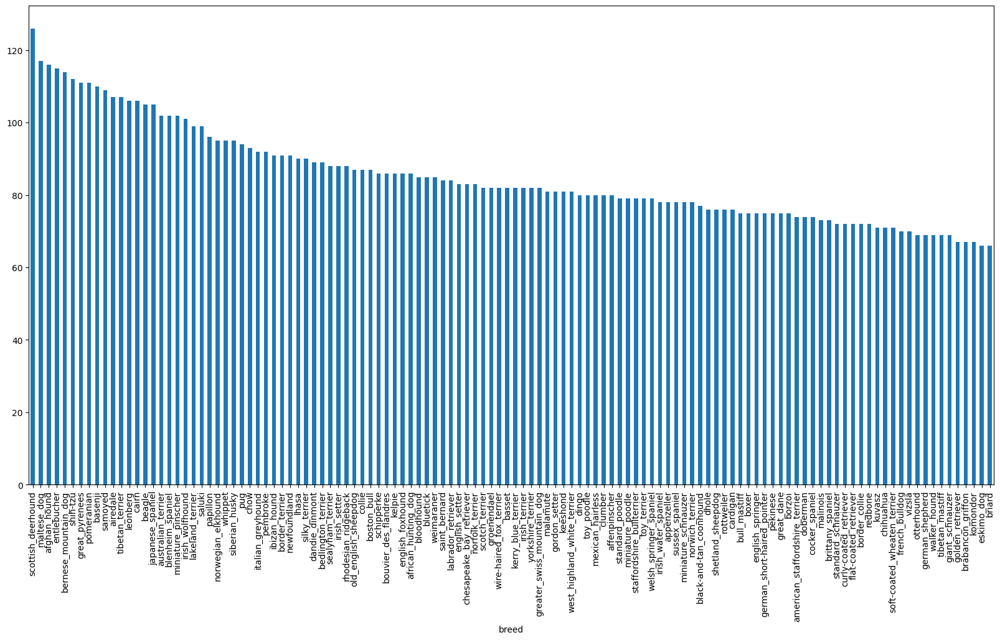

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

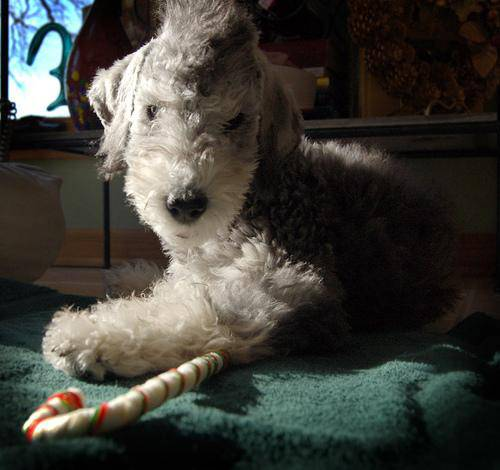

In [ ]:
# Lets view an image
from IPython.display import display, Image
Image("drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg")

## Getting images and thier labels
Let's get a list of our images file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathname from image ID's
filenames = ["drive/MyDrive/Dog-vision/train/" + fname for fname in labels_csv["id"] + ".jpg"]

# Check for first 10.
filenames[:10]

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check if number of file name matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog-vision/train/")) == len(filenames):
  print("Filenames match actual amount of files! Proceed. :)")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files! Proceed. :)


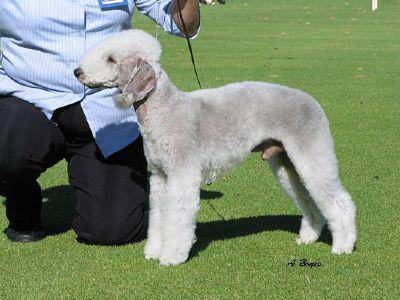

In [ ]:
# One more check
Image(filenames[300])

In [ ]:
labels_csv["breed"][300]

'bedlington_terrier'

Since i now have my training image filepath in a list, Now i prepare my data

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels is equal to the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filename!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filename!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of boleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Truning boolean array into integers
print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean arry
print(boolean_labels[0].astype(int))# There would be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


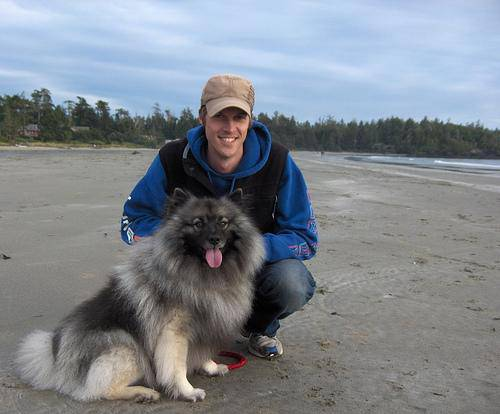

In [ ]:
Image(filenames[456])

In [ ]:
labels_csv["breed"][456]

'keeshond'

Creating a validation set

In [ ]:
# Set up X and y
X = filenames
y = boolean_labels

Starting with 100 images and increase from ther

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

# Split our data into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a look at the training data
X_train[0], y_train[0]

('drive/MyDrive/Dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
     

## Preprocessing image: Turning images into Tensors

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[4])
image[:2]

array([[[85, 87, 84],
        [85, 87, 84],
        [85, 87, 84],
        ...,
        [78, 84, 80],
        [78, 84, 80],
        [78, 84, 80]],

       [[83, 85, 82],
        [83, 85, 82],
        [83, 85, 82],
        ...,
        [78, 84, 80],
        [78, 84, 80],
        [78, 84, 80]]], dtype=uint8)

In [ ]:
# Convert image into a tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[85, 87, 84],
        [85, 87, 84],
        [85, 87, 84],
        ...,
        [78, 84, 80],
        [78, 84, 80],
        [78, 84, 80]],

       [[83, 85, 82],
        [83, 85, 82],
        [83, 85, 82],
        ...,
        [78, 84, 80],
        [78, 84, 80],
        [78, 84, 80]]], dtype=uint8)>

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Takes an image filename as input.
2. Uses TensorFlow to read the file and save it to a variable, image.
3. Turn our image (a jpeg file) into Tensors.
4. Normalize our `image` (convert color channsl values from 0-255 to 0-1)
4. Resize the image to be of shape (224, 224).
5. Return the modified image.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in an mage file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Truning our data into batches

why?


In [ ]:
# Create a simple function to return a tupule (image, label)
def get_image_label(image_path, label):
  """ It takes an image path name and the associated label,
  precesses the image and return a turple (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[44]), tf.constant(y[44]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.33140624, 0.33924937, 0.25689644],
         [0.4096647 , 0.41358626, 0.342998  ],
         [0.43735576, 0.4409622 , 0.38123253],
         ...,
         [0.8859506 , 0.8859506 , 0.8859506 ],
         [0.8756915 , 0.86784834, 0.87961304],
         [0.847015  , 0.8391719 , 0.8509366 ]],
 
        [[0.3521279 , 0.35710865, 0.2833429 ],
         [0.40803257, 0.41195413, 0.34709066],
         [0.4532748 , 0.45688123, 0.40260953],
         ...,
         [0.8772584 , 0.8772584 , 0.8772584 ],
         [0.86699927, 0.85915613, 0.87092084],
         [0.8383228 , 0.8304797 , 0.8422444 ]],
 
        [[0.39051124, 0.3944328 , 0.32554272],
         [0.42637193, 0.4302935 , 0.36924654],
         [0.4804272 , 0.4832528 , 0.43067926],
         ...,
         [0.8704376 , 0.8704376 , 0.8704376 ],
         [0.859515  , 0.8516719 , 0.8634366 ],
         [0.8290179 , 0.82117474, 0.83293945]],
 
        ...,
 
        [[0.5583288 , 0.57127315

Now we have a way to turn our data into tensor in the form of `(image, label)`
Now i will use a function to turn all our data (X & y) into batches

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batchs
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  #  If the data is a test dataset, we might not have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, i don't have to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    # Trun filepath label into tensor
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuple (this also turns the image path into a preprocesed image)
    data = data.map(get_image_label)

    # trun the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches
Creating validation data batches...


In [ ]:
# Check out diff attributes of our data format
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  This function plots data 25 images in a 5x5 grid from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplot (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

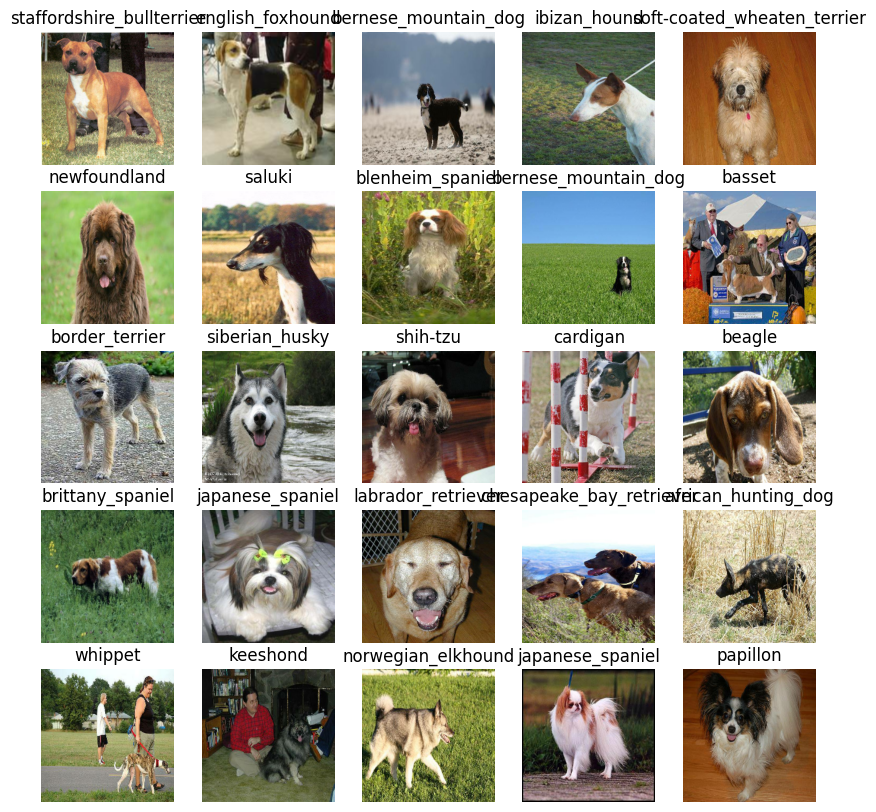

In [ ]:
# Now lwts visuslize the data in a training batch
show_25_images(train_images, train_labels)

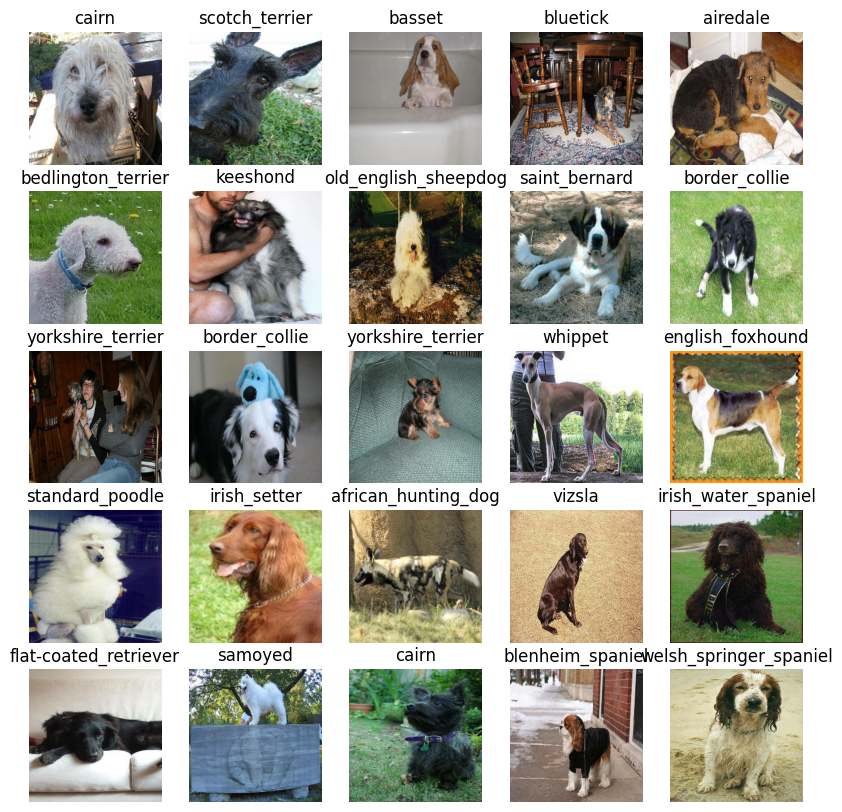

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building the model



In [ ]:
#  Setup input shape to the model
INPUT_SHAPE = (None, IMG_SIZE, IMG_SIZE, 3) # batch, height, width, colour channels

# Setup the output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup the model URL using TensorHub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

I have my input, output and model ready
Let put together the keras deep learning

In [ ]:
# Create a function which build a kares model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

## TensorBoard callback

In [ ]:
# Load tensorboard extension
%load_ext tensorboard

In [ ]:
# !pip install matplotlib-venn

In [ ]:
from datetime import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  today = datetime.now()
  # create a log directory for sorting tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog-vision/logs",
                        #  Make it so the logs get tracked whenever we run an experinment
                        today.strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping callbacks

In [ ]:
# Create early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training our model (no subset data)

The first model will train with only 1000 images

In [ ]:
NUM_EPOCHS = 30 #@param {type: "slider", min:10, max:100, step:10}

In [ ]:
# Build a function which trains a model and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # create a model
  model = create_model()

  # create new tensorboard session  everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it to the callback we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 177s 7s/step - loss: 4.4876 - accuracy: 0.1150 - val_loss: 3.4236 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 43s 2s/step - loss: 1.5869 - accuracy: 0.6875 - val_loss: 2.2201 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 44s 2s/step - loss: 0.5628 - accuracy: 0.9212 - val_loss: 1.7131 - val_accuracy: 0.5450
Epoch 4/100
25/25 [==============================] - 42s 2s/step - loss: 0.2558 - accuracy: 0.9900 - val_loss: 1.5207 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 45s 2s/step - loss: 0.1498 - accuracy: 0.9937 - val_loss: 1.4572 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 43s 2s/step - loss: 0.1017 - accuracy: 0.9987 - val_loss: 1.4065 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog-vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 9s 1s/step


array([[1.00280065e-03, 2.81854591e-05, 1.48124003e-03, ...,
        8.21282039e-04, 1.46245657e-04, 1.68700714e-03],
       [8.55471008e-03, 9.22722160e-04, 2.66174581e-02, ...,
        1.01323565e-03, 9.29011125e-03, 1.34113559e-03],
       [6.45333275e-05, 5.11249018e-05, 1.00048164e-04, ...,
        1.36663776e-03, 2.32470338e-04, 1.69401319e-04],
       ...,
       [5.58670654e-05, 1.28370113e-04, 1.39609008e-04, ...,
        3.01075124e-05, 5.91777149e-04, 9.99705517e-05],
       [9.80200828e-04, 2.11048537e-04, 2.40353256e-04, ...,
        1.57874470e-04, 2.69604207e-04, 1.72840338e-02],
       [2.49224278e-04, 2.36083597e-05, 1.87819893e-03, ...,
        5.97976614e-03, 1.18743978e-03, 1.85769226e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# Frist prediction
index = 42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.04056169e-04 6.44520915e-05 1.53792527e-04 2.25167023e-04
 8.81385989e-03 2.39929068e-05 8.61835317e-04 3.41136288e-03
 3.39761446e-03 1.31060511e-01 5.05624994e-05 5.34566134e-05
 8.29768367e-04 3.30173178e-03 2.94241146e-03 1.90325803e-03
 2.95437403e-05 3.06190341e-04 3.00692918e-04 3.46025277e-04
 1.09717024e-04 1.35304965e-03 2.19992362e-04 3.15831094e-05
 2.10740231e-02 1.11109694e-04 6.29277856e-05 2.28885168e-04
 2.96254759e-04 1.26844961e-05 2.70570337e-04 6.54131436e-05
 1.83900265e-04 1.72810876e-04 8.93589604e-05 2.88752453e-05
 2.21525770e-04 8.00998183e-04 1.23858583e-04 1.53143451e-01
 8.17878827e-05 4.85316195e-05 6.01790566e-03 6.07416368e-05
 4.59021481e-04 2.53052367e-05 2.39543137e-04 1.12175720e-03
 9.03797918e-05 2.12268802e-04 3.18759885e-05 1.07955471e-04
 8.59488675e-04 2.92296661e-03 6.98738004e-05 2.00338764e-04
 5.54605387e-04 6.84586994e-05 6.89770095e-05 3.89141860e-05
 2.08153520e-04 1.83686614e-03 5.04114578e-05 9.70005422e-05
 2.88410927e-04 1.774362

In [ ]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale

And it would be even better if we could see the image the prediction is being made on!

**Note** Prediction probability are also known as confidence level

In [ ]:
# Trun prediction probabilities into thier respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted lable based on an array of prediction probability

pred_label = get_pred_label(predictions[81])
pred_label

'irish_setter'

Since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

Now we have ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make this more visualizable

We'll create a function which:
* Takes any array of prediction probabilities, an array of truth labels and an array of images and integers.
* Converts the prediction probabilities to predicted label.
* Plot the predicted labels, its predicted probability, the truth label and the target images on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Change plot title to be the prediciton and truth labels
  plt.title("{} {:.2f}% {}".format(pred_label,
                                   np.max(pred_prob)* 100,
                                   true_label),
                                  color=color)

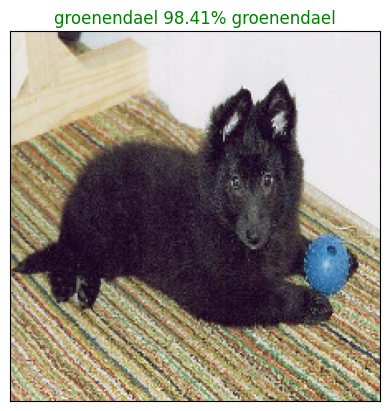

In [ ]:
plot_pred(predictions, val_labels, val_images, n=77)

Now we've have one function to visualize our top prediction, let's make another to view our models top 10 predictions

This function will:
* Take an input of a prediction probability array and a ground truth array and an integer✅
* Find the predicted label using `get_pred_label()`✅
* Find the top 10:
  * Prediction probability indexes✅
  * Prediction probability values✅
  * Prediction labels✅
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="gray")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

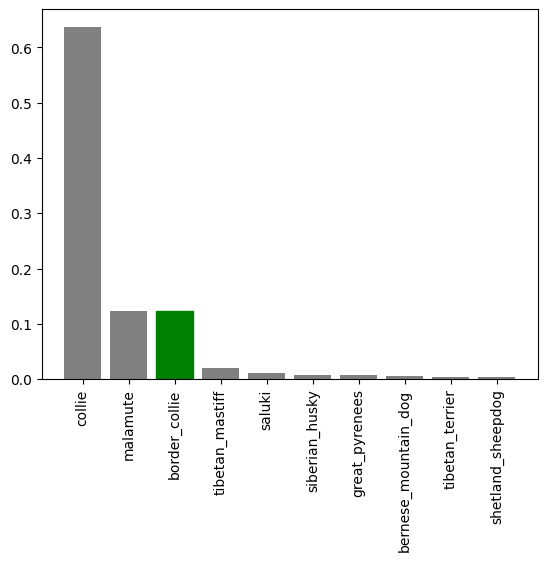

In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

Now we have some functions to visualize our predictions and evaluate our model, let's check out a few

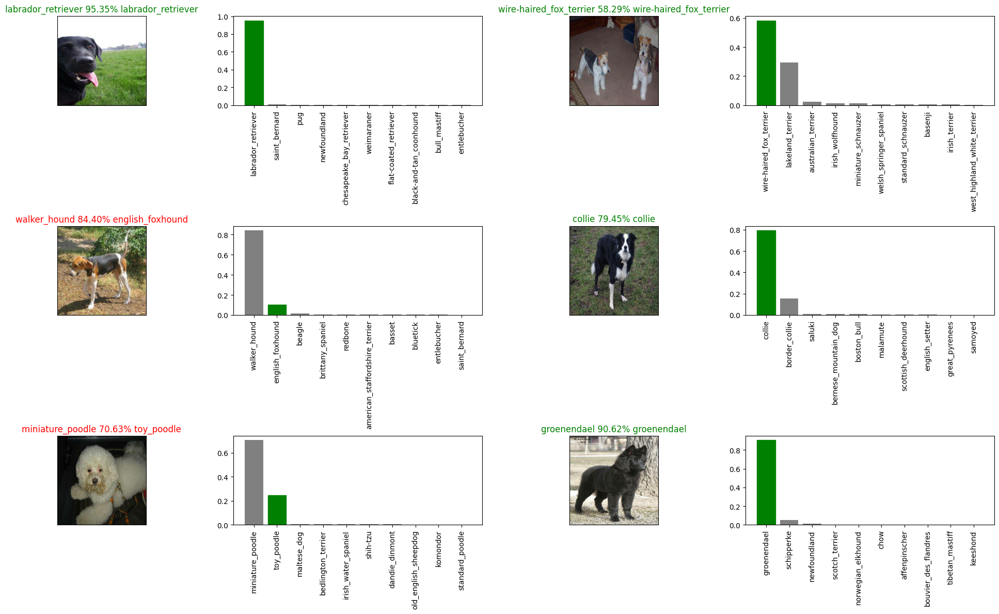

In [ ]:
# Let's check out a few predictions and thier different values
i_multipier = 40
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(5*2*num_cols, 4*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, n=i+i_multipier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, n=i+i_multipier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model


In [ ]:
#  Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog-vision/models",
                          datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a saved model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we have the functions to save and load models

In [ ]:
# Save our model traind on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog-vision/models/20250620-16591750438783-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-vision/models/20250620-16591750438783-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Laod a saved model
loaded_1000_image_model = load_model("drive/MyDrive/Dog-vision/models/20250529-22081748556534-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog-vision/models/20250529-22081748556534-1000-images-mobilenetv2-Adam.h5


In [ ]:

# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 12s 2s/step - loss: 1.2896 - accuracy: 0.6700


[1.2895666360855103, 0.6700000166893005]

## Training a big dog model🐶(on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callback
full_model_tensorboard = create_tensorboard_callback()

# Create early stopping callback, No validation set when training with all the data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                             patience=3)

**Note:** Running the cell alone will take a little while
(maybe up to 30 minutes for the first epoch) because the GPU we'er using in the runtime has to load all of the images into memory.

In [1]:
# Fit the full model to the full model
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="all-images-mobilenetv2-Adam")

In [ ]:
# Load the full model
loaded_full_model = load_model('')

## Making the prediction on the test dataset

Since our model has been train on the images in the form of tensor batches, to make prediction on the test set we will have to get it into the same formart.

Luckily we created `create_data_batches()` earlier which can take a list of filename as input and convert them into Tensor batches.

To make predictions on the test data we'll:
* Get the test images filename
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (Since the test daata doesn't have labels).
* Make predictions array by passing the test batches to the`predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "/drive/MyDrive/Dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
test_data

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run

In [ ]:
# Make predictions on test data using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for across later)
np.savetxt("drive/MyDrive/Dog-vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog-vision/preds_array.csv', delimiter=',')

In [ ]:
test_predictions[:10]

In [ ]:
test_predictions.shape

## Preparing test dataset prediction for kaggle

Looking at the sample kaggle submission, we find that it wants our model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data into this format, we'll:
* Create a pandas DataFrame with anID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from thier filepaths.
* Add data (the predition probability) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit to Kaggle

In [ ]:
# Create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

In [ ]:
# Add the predictions to each dog breed column
preds_df[unique_breeds] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions dataframe to CSV for submission to kaggle
preds_df.to_csv("drive/MyDrive/Dog-vision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)